In [ ]:
from __future__ import print_function
import numpy as np
import matplotlib.pyplot as plt
import librosa #for music and audio analysis
import soundfile as sf #read and write mp3

In [ ]:
# Load the audio file '/content/hurt.mp3' using librosa.load()
# y: audio time series
# sr: sampling rate of `y`
y, sr = librosa.load('/content/hurt.mp3', duration=120)
# Compute the spectrogram magnitude and phase using librosa.stft()
# S_full: complex-valued short-time Fourier transform (STFT)
# phase: phase components of the STFT
S_full, phase = librosa.magphase(librosa.stft(y))

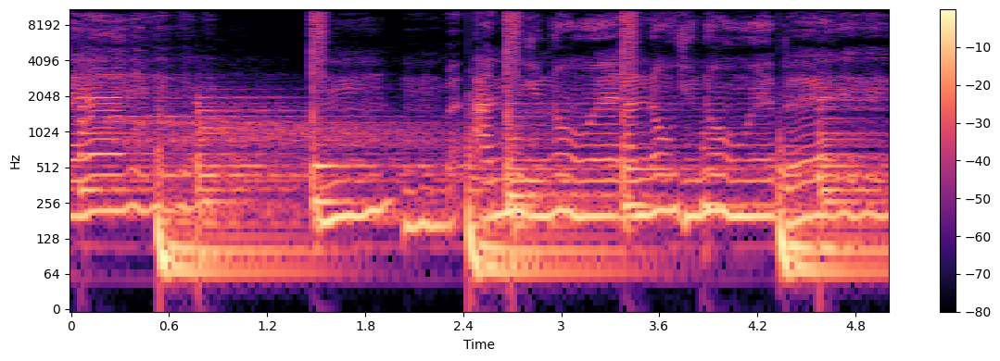

In [ ]:
# Convert the time range to frames using librosa.time_to_frames()
# idx: slice object representing the frame range of interest

idx = slice(*librosa.time_to_frames([30, 35], sr=sr))
# Create a figure for plotting
plt.figure(figsize=(12, 4))
# Display the spectrogram within the specified time range
# librosa.amplitude_to_db() converts the magnitude spectrogram to dB->intensity or power of a signal or sound scale
# np.max() is used as the reference value for the conversion
# y_axis='log' sets the y-axis to logarithmic scale
# x_axis='time' sets the x-axis to time
# sr=sr sets the sampling rate of the spectrogram
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

In [ ]:
# Apply a non-negative filter to the spectrogram
# librosa.decompose.nn_filter() applies a filter to suppress background noise
# S_full: the original spectrogram
# aggregate=np.median: the aggregation function to apply over the filter window
# metric='cosine': the distance metric used to compare spectrogram frames
# width: the width of the filter window in frames
S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))
# Combine the original spectrogram with the filtered spectrogram
S_filter = np.minimum(S_full, S_filter)

In [ ]:
from IPython.display import Audio

# Set the margin parameters and the power for softmasking
margin_i, margin_v = 2, 10
power = 2.5

# Create a softmask for the foreground
mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

# Create a softmask for the background
mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Obtain the foreground and background spectrograms by applying the masks
S_foreground = mask_v * S_full
S_background = mask_i * S_full

# Convert the foreground spectrogram back to a time-domain signal
y_foreground = librosa.istft(S_foreground * phase)

# Normalize the foreground signal
y_foreground = librosa.util.normalize(y_foreground)



# Convert the background spectrogram back to a time-domain signal
y_background = librosa.istft(S_background * phase)

# Normalize the background signal
y_background = librosa.util.normalize(y_background)

# Play the foreground audio
Audio(y_foreground, rate=sr)

In [ ]:
# Play the background audio
Audio(y_background, rate=sr)

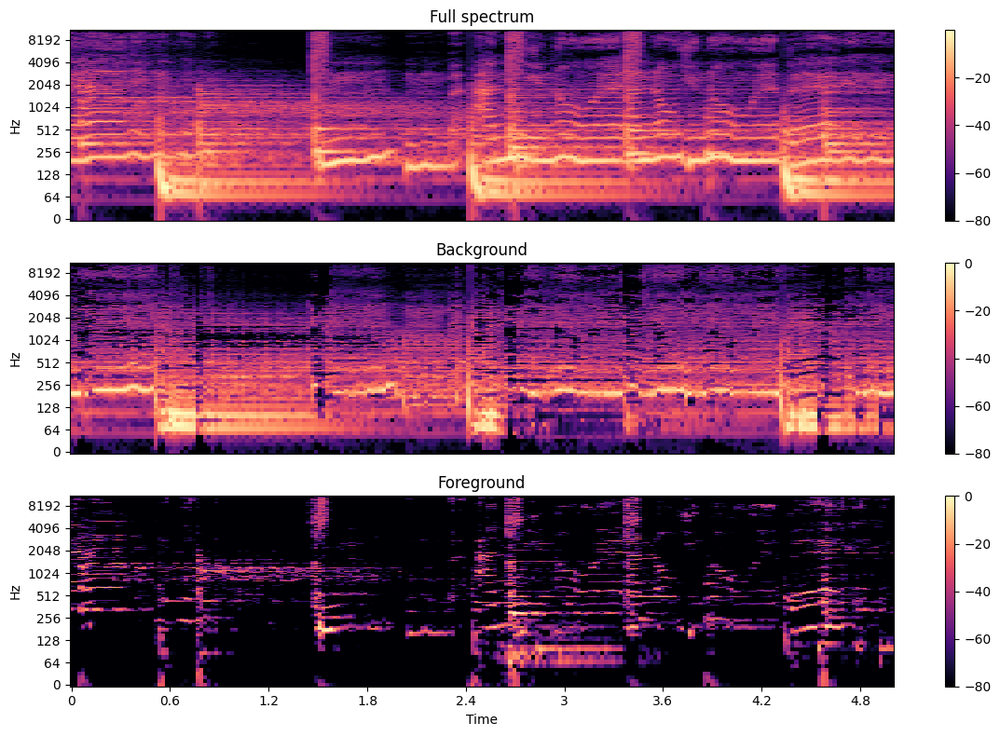

In [ ]:

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background[:, idx], ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import soundfile as sf


# Load the audio signal
y, sr = librosa.load('/content/hurt.mp3', duration=120)

# Convert the secret data into a binary stream
secret_data = "This is a secret message"
secret_bits = ''.join(format(ord(c), '08b') for c in secret_data)

# Loop through the samples and replace their LSBs with the secret bits
modified_samples = []
bit_index = 0
for sample in y:
  # Convert the sample to an integer
  sample_int = int(sample * 32768)
  # Replace the LSB with the next bit of the secret data
  if bit_index < len(secret_bits):
    bit = int(secret_bits[bit_index])
    sample_int = (sample_int & ~1) | bit
    bit_index += 1
  # Convert the sample back to a float
  sample_float = sample_int / 32768.0
  # Append the modified sample to the list
  modified_samples.append(sample_float)

# Convert the list to a numpy array
modified_y = np.array(modified_samples)

# Save the modified audio signal as a new file
#sf.write('/content/stego_audio.wav', modified_y, sr)
Audio(modified_y, rate=sr)